In [1]:
from exp.nb_Tesis import *

import warnings
warnings.filterwarnings("ignore", category=UserWarning, module="torch.nn.functional")

In [2]:
path_train_images = Path('2017/data/ISIC-2017_Training_Data/')

In [3]:
list_of_image_paths = get_image_files(path_train_images)

In [4]:
assert len(list_of_image_paths) == 2000

In [5]:
img = open_image(list_of_image_paths[0])

In [6]:
list_of_image_paths[1]

PosixPath('2017/data/ISIC-2017_Training_Data/ISIC_0013962.jpg')

In [12]:
def get_ex(): return open_image(path_train_images/'ISIC_0000251.jpg')

# Usamos get_ex pues crop modifica inplace

NameError: name 'var' is not defined

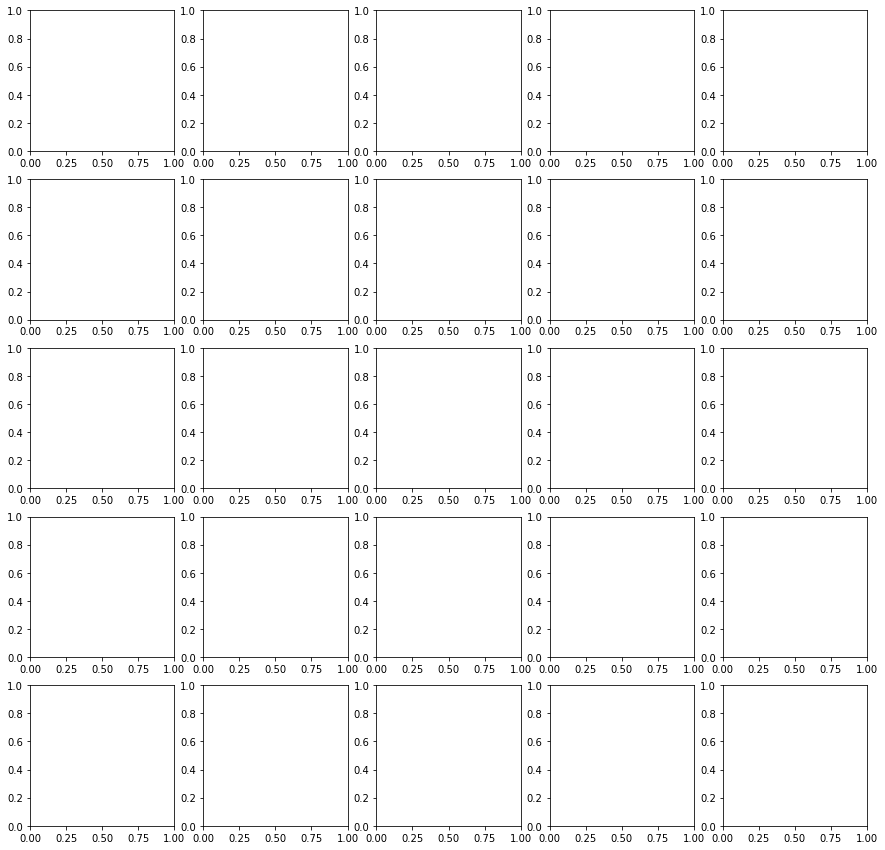

In [20]:

fig, axs = plt.subplots(5,5,figsize=(15,15))
for zoom in range(1,6):
    img = get_ex()
    min_dim = min(img.data.shape[1:])
    min_dim = min_dim//zoom
    
    for center, ax in zip([[0.,0.], [0.,1.],[0.5,0.5],[1.,0.], [1.,1.]], axs[zoom-1]):
        row_pct, col_pct = [0.5 + ((i-0.5)/(zoom**(1/3))) for i in center]
        e = crop(get_ex(), min_dim, row_pct,col_pct )
        e.show(ax=ax, title=f'center=({row_pct:.2}, {col_pct:.2}), z={zoom}')

# Otra forma

In [13]:
def plots_f(rows, cols, width, height, **kwargs):
    [get_ex().apply_tfms(tfms[0], **kwargs).show(ax=ax) for i,ax in enumerate(plt.subplots(
        rows,cols,figsize=(width,height))[1].flatten())]

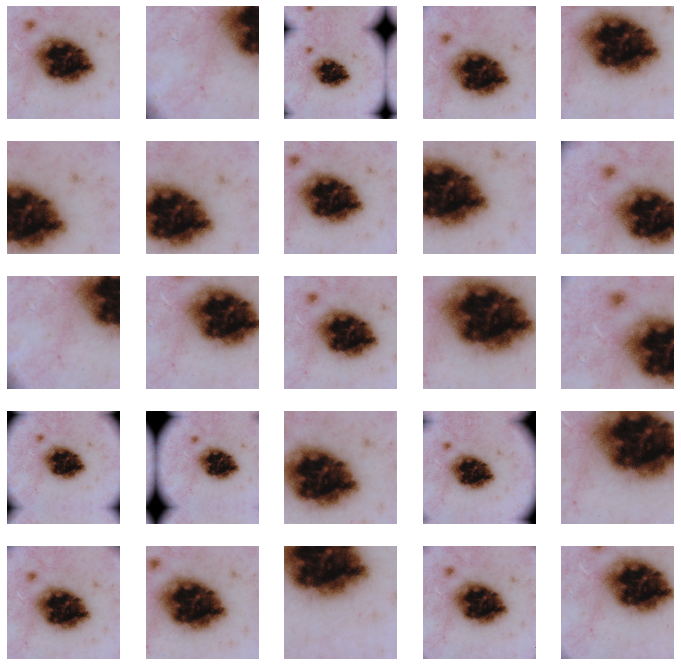

In [17]:
tfms = zoom_crop(scale=(.75,2), do_rand=True)
plots_f(5, 5, 12, 12, size=224)


In [18]:
samples_per_image= 60

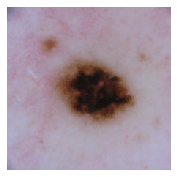

In [29]:
get_ex().apply_tfms(tfms[0],size=224 ).show()

In [7]:
path_train_images = Path('2017/data/ISIC-2017_Training_Data/')
path_valid_images = Path('2017/data/ISIC-2017_Validation_Data/')

dest_path = Path('/data2/mike/augmented_images/validation/')

# dest_path.mkdir(parents=True)
samples_per_image = 60

tfms = zoom_crop(scale=(.75,2), do_rand=True)

list_of_image_paths = get_image_files(path_valid_images)
n_of_imgs = len(list_of_image_paths)
for idx, image_path in enumerate(list_of_image_paths):
    img = open_image(image_path)
    for sample_number in range(samples_per_image):
        tfmd_img = img.apply_tfms(tfms[0], size=224)
        img_name_without_extension = image_path.name[:-4]
        path_img_dest = dest_path / (img_name_without_extension + f'_sample_{sample_number}.jpg')
#         print(path_img_dest)
        tfmd_img.save(path_img_dest)
    
        update_progress(((idx) * (samples_per_image) + sample_number + 1) / (n_of_imgs * samples_per_image))


Progress: [####################] 100.0%


In [33]:
p = list_of_image_paths[0]

In [42]:
p.name[:-4]

'ISIC_0000331'

In [46]:
img.save('2017/test.jpg')

In [90]:
img = open_image(list_of_image_paths[1])

In [91]:
img2 = img.apply_tfms(tfms[0],size=224)

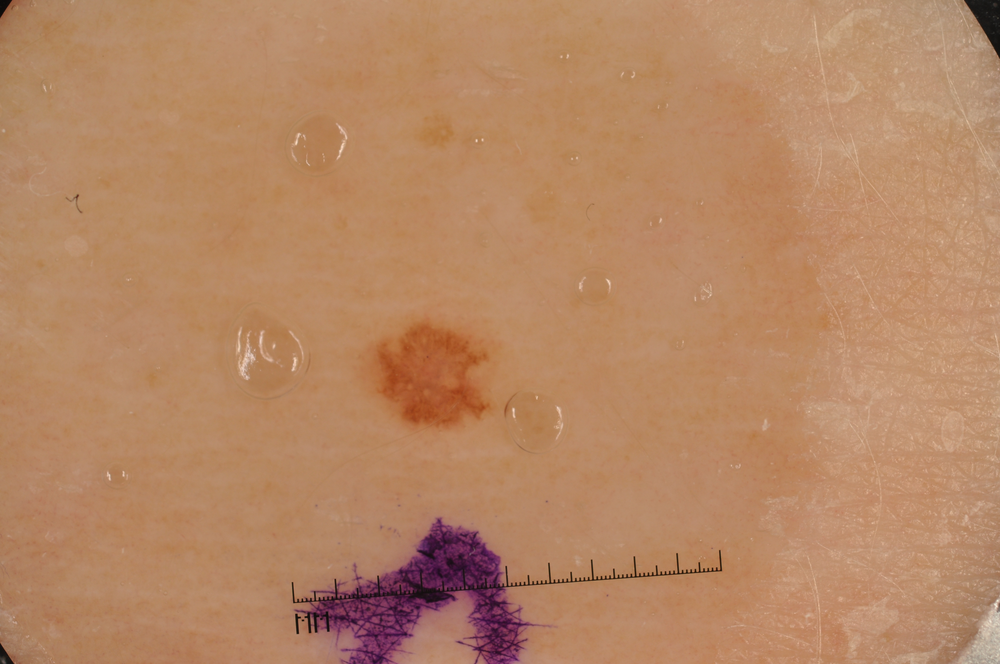

In [92]:
img

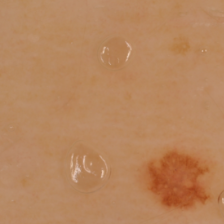

In [93]:
img2